In [2]:
import json
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from pathlib import Path
import pycocotools.mask as mask_util
import pycocotools.mask as mask_utils
import matplotlib.patches as mpatches
from collections import defaultdict
from matplotlib.patches import Patch
import colorsys


# Utils

## annotaitons debugging

In [ ]:
def get_annotation_by_uid(uid: str):
    """
    Search for an annotation by UID across all relation annotation files.
    
    Args:
        uid: The take UID to search for
        
    Returns:
        tuple: (annotation_dict, file_name) if found, (None, None) if not found
    """
    relation_annotations_dir = Path("annotations/relation_annotations")
    json_files = [
        "relations_train.json",
        "relations_val.json", 
        "relations_test.json"
    ]
    
    for json_file in json_files:
        file_path = relation_annotations_dir / json_file
        if not file_path.exists():
            continue
            
        try:
            with open(file_path, 'r') as f:
                data = json.load(f)
            
            annotations = data.get('annotations', {})
            if uid in annotations:
                return annotations[uid], json_file
        except Exception as e:
            print(f"Error reading {json_file}: {e}")
            continue
    
    return None, None


In [16]:
uid = "f8bed5fe-3e09-4885-9539-edb4d5b2279a" 

annotation, source_file = get_annotation_by_uid(uid)

if annotation:
    print(f"Found in: {source_file}")
    print(f"Scenario: {annotation.get('scenario', 'N/A')}")
    print(f"Take name: {annotation.get('take_name', 'N/A')}")
    with open("object_masks_output.json", "w") as f:
        json.dump({"object_masks": annotation.get("object_masks", {})}, f, indent=2)
    print(f"Object masks count: {len(annotation.get('object_masks', {}))}")
else:
    print("UID not found in any annotation file")

Found in: relations_train.json
Scenario: Covid-19 Rapid Antigen Test
Take name: sfu_covid_009_7
Object masks count: 1


In [ ]:
def parse_uid_file(filepath):
    """Parse a UID file with # TRAIN, # VAL, # TEST sections"""
    splits = {"train": [], "val": [], "test": []}
    current_split = None
    
    with open(filepath, 'r') as f:
        for line in f:
            line = line.strip()
            
            if line == "# TRAIN":
                current_split = "train"
            elif line == "# VAL":
                current_split = "val"
            elif line == "# TEST":
                current_split = "test"
            elif line and not line.startswith("#") and current_split:
                splits[current_split].append(line)
    
    return splits

cooking_splits = parse_uid_file('annotations/relation_annotations/target_uids_cooking.txt')
health_splits = parse_uid_file('annotations/relation_annotations/target_uids_health.txt')

with open('annotations/relation_annotations/cooking_split.json', 'w') as f:
    json.dump(cooking_splits, f, indent=2)

with open('annotations/relation_annotations/health_split.json', 'w') as f:
    json.dump(health_splits, f, indent=2)

print("Cooking splits:")
print(f"  Train: {len(cooking_splits['train'])} UIDs")
print(f"  Val: {len(cooking_splits['val'])} UIDs")
print(f"  Test: {len(cooking_splits['test'])} UIDs")

print("\nHealth splits:")
print(f"  Train: {len(health_splits['train'])} UIDs")
print(f"  Val: {len(health_splits['val'])} UIDs")
print(f"  Test: {len(health_splits['test'])} UIDs")

Cooking splits:
  Train: 288 UIDs
  Val: 82 UIDs
  Test: 110 UIDs

Health splits:
  Train: 55 UIDs
  Val: 12 UIDs
  Test: 23 UIDs


In [ ]:
with open('results/O-MaMa/health/normal/inference_finetuned_weights_2/exo2ego_predictions_Eval_finetuned_OMAMA_ExoEgo_health_norm.json') as f:
    data = json.load(f)

observations = []
for take_uid, take_data in data['exo-ego']['results'].items():
    for obj_name, obj_data in take_data['masks'].items():
        for cam_name, cam_data in obj_data.items():
            for frame_num, frame_data in cam_data.items():
                observations.append({
                    'take_uid': take_uid,
                    'object': obj_name,
                    'camera': cam_name,
                    'frame': frame_num,
                    'confidence': frame_data['confidence'][0]
                })

frame_index = 5
print(f"Frame with IoU=0 at index {frame_index}: {observations[frame_index]}")

Frame with IoU=0 at index 5: {'take_uid': '7b839fc9-8b7c-47f1-b55e-2247dfd8eb41', 'object': 'SARS-CoV-2 Antigen rapid test_0', 'camera': 'cam01_aria02_214-1', 'frame': '240', 'confidence': 0.6127089262008667}


# Visuals

## Series of ego frames, single take

This code defines a function that visualizes segmentation results for a specific frame or a few samples from a predictions JSON and ground truth JSON. For each selected frame, it loads the prediction and ground truth masks, resizes them to fit the original image if needed, overlays the masks onto the image (coloring predictions red, GT green, and overlap yellow), computes the IoU, and displays this in a matplotlib plot. It is used in a loop to visualize results for multiple frames.

In [ ]:
def plot_prediction_vs_gt_mask(
    predictions_json_path,
    gt_json_path,
    root_dir,
    take_uid=None,
    object_name=None,
    camera_name=None,
    frame_num=None,
    num_samples=1
):
    """
    Plot predicted and GT masks overlaid on original images. Handles mask resizing.
    Also computes and displays IoU between prediction and GT.
    """

    with open(predictions_json_path, 'r') as f:
        pred_data = json.load(f)
    results = pred_data['exo-ego']['results']

    with open(gt_json_path, 'r') as f:
        gt_data = json.load(f)
    gt_results = gt_data['annotations']
    processed_dir = Path(root_dir) / 'processed'

    predictions = []
    for take_id, take_data in results.items():
        if 'masks' not in take_data:
            continue
        for obj_name, obj_data in take_data['masks'].items():
            for cam_name, cam_data in obj_data.items():
                for frame_id, frame_data in cam_data.items():
                    predictions.append({
                        'take_uid': take_id,
                        'object_name': obj_name,
                        'camera_name': cam_name,
                        'frame_num': frame_id,
                        'pred_mask': frame_data['pred_mask'],
                        'confidence': frame_data.get('confidence', [0])[0]
                    })

    print(f"Total predictions available: {len(predictions)}")

    if take_uid or object_name or camera_name or frame_num:
        filtered = [p for p in predictions if 
                   (take_uid is None or p['take_uid'] == take_uid) and
                   (object_name is None or p['object_name'] == object_name) and
                   (camera_name is None or p['camera_name'] == camera_name) and
                   (frame_num is None or p['frame_num'] == frame_num)]

        if len(filtered) == 0:
            print("\nNo predictions found matching criteria!")
            print(f"Searched for: take_uid={take_uid}, object={object_name}, camera={camera_name}, frame={frame_num}")
            if take_uid:
                take_preds = [p for p in predictions if p['take_uid'] == take_uid]
                if take_preds:
                    print(f"\nAvailable in JSON for take {take_uid}:")
                    cameras = set(p['camera_name'] for p in take_preds)
                    for cam in sorted(cameras):
                        frames = sorted([int(p['frame_num']) for p in take_preds if p['camera_name'] == cam])
                        if frames:
                            frame_min = min(frames)
                            frame_max = max(frames)
                            print(f"  - {cam}: {len(frames)} frames (range: {frame_min}-{frame_max})")
            return None

        predictions = filtered
    else:
        import random
        predictions = random.sample(predictions, min(num_samples, len(predictions)))

    print(f"Plotting {len(predictions)} prediction(s)")

    n_plots = len(predictions)
    fig, axes = plt.subplots(1, n_plots, figsize=(8*n_plots, 8))
    if n_plots == 1:
        axes = [axes]

    for idx, pred in enumerate(predictions):
        # Handle camera name mapping: JSON has 'cam01_aria02_214-1' but folder is 'aria02_214-1'
        cam_folder = pred['camera_name']
        if '_' in cam_folder:
            cam_folder_stripped = '_'.join(cam_folder.split('_')[1:])
        else:
            cam_folder_stripped = cam_folder

        img_path = processed_dir / pred['take_uid'] / cam_folder_stripped / f"{pred['frame_num']}.jpg"
        if not img_path.exists():
            img_path = processed_dir / pred['take_uid'] / cam_folder / f"{pred['frame_num']}.jpg"
        if not img_path.exists():
            img_path = processed_dir / pred['take_uid'] / cam_folder_stripped / f"{pred['frame_num']}.png"
        if not img_path.exists():
            img_path = processed_dir / pred['take_uid'] / cam_folder / f"{pred['frame_num']}.png"

        if not img_path.exists():
            print(f"Image not found. Tried:")
            print("  - {}".format(processed_dir / pred['take_uid'] / cam_folder_stripped / f"{pred['frame_num']}.jpg"))
            print("  - {}".format(processed_dir / pred['take_uid'] / cam_folder / f"{pred['frame_num']}.jpg"))
            continue

        img = Image.open(img_path).convert('RGB')
        img_array = np.array(img)

        # Decode prediction RLE mask and adapt mask to image size
        pred_rle = pred['pred_mask']
        pred_mask = mask_util.decode(pred_rle)

        if pred_mask.shape[0] != img_array.shape[0] or pred_mask.shape[1] != img_array.shape[1]:
            pil_mask = Image.fromarray(pred_mask.astype(np.uint8) * 255)
            pil_mask = pil_mask.resize((img_array.shape[1], img_array.shape[0]), resample=Image.NEAREST)
            pred_mask = (np.array(pil_mask) > 127).astype(np.uint8)

        # Obtain gt RLE by matching take_uid, object_name, camera_name, frame_num in GT JSON
        gt_mask = None
        try:
            gt_take = gt_results[pred['take_uid']]['masks']
            gt_obj = gt_take[pred['object_name']]
            gt_cam = gt_obj.get(pred['camera_name'], None)

            if gt_cam is None:
                cam_folder_alt = '_'.join(pred['camera_name'].split('_')[1:]) if '_' in pred['camera_name'] else pred['camera_name']
                gt_cam = gt_obj.get(cam_folder_alt, None)
            if gt_cam is not None and pred['frame_num'] in gt_cam:
                gt_rle = gt_cam[pred['frame_num']]
                gt_mask_raw = mask_util.decode(gt_rle)

                if gt_mask_raw.shape != img_array.shape[:2]:
                    pil_mask = Image.fromarray(gt_mask_raw.astype(np.uint8)*255)
                    pil_mask = pil_mask.resize((img_array.shape[1], img_array.shape[0]), resample=Image.NEAREST)
                    gt_mask = (np.array(pil_mask) > 127).astype(np.uint8)
                else:
                    gt_mask = gt_mask_raw
            else:
                print("WARNING: GT mask not found for this prediction.")
                gt_mask = None
        except Exception as e:
            print(f"GT mask loading failed: {e}")
            gt_mask = None


        if gt_mask is not None and pred_mask is not None:
            intersection = np.logical_and(gt_mask, pred_mask).sum()
            union = np.logical_or(gt_mask, pred_mask).sum()
            iou_value = intersection / union if union > 0 else float('nan')
        else:
            iou_value = float('nan')


        overlay = img_array.copy()
        pred_color = np.array([255, 0, 0], dtype=np.uint8) 
        gt_color   = np.array([0, 255, 0], dtype=np.uint8)   
        yellow_color = np.array([255, 255, 0], dtype=np.uint8)

        pred_indices = (pred_mask == 1)
        gt_indices = (gt_mask == 1) if gt_mask is not None else np.zeros_like(pred_mask, dtype=bool)
        overlap_indices = pred_indices & gt_indices
        only_pred = pred_indices & (~overlap_indices)
        only_gt = gt_indices & (~overlap_indices)


        alpha = 0.5
        # GT-only regions (green)
        overlay[only_gt] = (overlay[only_gt].astype(float) * alpha + gt_color * (1-alpha)).astype(np.uint8)
        # Pred-only regions (red)
        overlay[only_pred] = (overlay[only_pred].astype(float) * alpha + pred_color * (1-alpha)).astype(np.uint8)
        # Overlap (yellow)
        overlay[overlap_indices] = (overlay[overlap_indices].astype(float) * (1-alpha) + yellow_color * alpha).astype(np.uint8)


        axes[idx].imshow(overlay)
        info = []
        info.append(f"Take: {pred['take_uid'][:8]}...")
        info.append(f"Object: {pred['object_name']}")
        info.append(f"Camera: {pred['camera_name']}")
        info.append(f"Frame: {pred['frame_num']}")
        info.append(f"Confidence: {pred['confidence']:.3f}")
        if not np.isnan(iou_value):
            info.append(f"IoU: {iou_value:.3f}")
        else:
            info.append("IoU: N/A")
        axes[idx].set_title("\n".join(info), fontsize=10)
        axes[idx].axis('off')

        import matplotlib.patches as mpatches
        red_patch = mpatches.Patch(color='#ff0000', label='Prediction')
        green_patch = mpatches.Patch(color='#00ff00', label='Ground Truth')
        yellow_patch = mpatches.Patch(color='#ffff00', label='Overlap')
        axes[idx].legend(handles=[red_patch, green_patch, yellow_patch], loc='lower right', fontsize=10)

    plt.tight_layout()
    plt.show()

    return predictions

for i in range(0,2001,30):
    frame_num = str(i)
    plot_prediction_vs_gt_mask(
        predictions_json_path='../results/evaluation_baseline_run_dinov2/exo2ego_predictions_Evaluation_OMAMA_Precomputed.json',
        gt_json_path='../results/evaluation_baseline_run_dinov2/exo2egoGT.json',
        root_dir='health_normal_data_omama',
        take_uid='8bb95fbe-efa4-416b-9558-a0301b846f25',
        camera_name='cam04_aria02_214-1',
        frame_num=frame_num,
        object_name='extraction buffer tube package_0',
        num_samples=1
    )

## Finetuned vs baseline find differences

This code compares segmentation results of finetuned and baseline (pretrained) models on a given dataset. It locates up to 10 cases where the baseline model's IoU is zero but the finetuned model achieves a significantly positive IoU (>0.05), visualizes these cases, and summarizes statistics about IoU improvement. Functions are used to compute IoU, load and resize masks, overlay results, and plot the findings.


Finding cases where baseline IoU == 0 and finetuned IoU > 0...
Found 10 cases where baseline IoU == 0 and finetuned IoU > 0.05


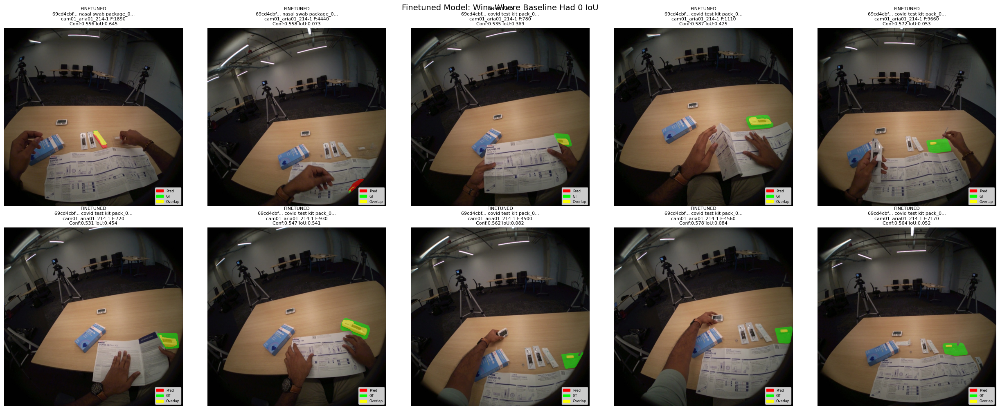

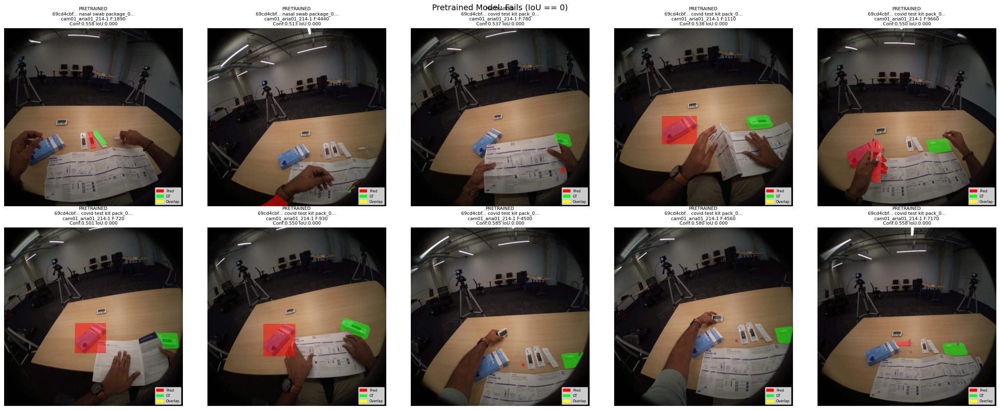


=== SUMMARY ===
Finetuned IoUs: ['0.645', '0.073', '0.369', '0.425', '0.053', '0.454', '0.541', '0.082', '0.084', '0.052']
Pretrained IoUs: ['0.000', '0.000', '0.000', '0.000', '0.000', '0.000', '0.000', '0.000', '0.000', '0.000']

Finetuned stats: mean=0.278, median=0.226
Finetuned beats baseline in all shown cases (by search definition)


In [ ]:
def compute_iou(mask1, mask2):
    intersection = np.logical_and(mask1, mask2).sum()
    union = np.logical_or(mask1, mask2).sum()
    return intersection / union if union > 0 else 0.0

def load_mask(mask_rle, target_shape):
    mask = mask_util.decode(mask_rle)
    if mask.shape[:2] != target_shape:
        mask = np.array(Image.fromarray((mask * 255).astype(np.uint8)).resize(
            (target_shape[1], target_shape[0]), resample=Image.NEAREST)) > 127
    return mask.astype(np.uint8)

def plot_overlay(pred_mask, gt_mask, img_array):
    overlay = img_array.copy()
    pred_only = (pred_mask == 1) & (gt_mask == 0)
    gt_only = (gt_mask == 1) & (pred_mask == 0)
    overlap = (pred_mask == 1) & (gt_mask == 1)
    
    overlay[gt_only] = (overlay[gt_only] * 0.5 + np.array([0, 255, 0]) * 0.5).astype(np.uint8)
    overlay[pred_only] = (overlay[pred_only] * 0.5 + np.array([255, 0, 0]) * 0.5).astype(np.uint8)
    overlay[overlap] = (overlay[overlap] * 0.5 + np.array([255, 255, 0]) * 0.5).astype(np.uint8)
    return overlay

def plot_cases(cases, title, model_results, is_comparison=False):
    fig, axes = plt.subplots(2, 5, figsize=(25, 10))
    axes = axes.flatten()
    
    for idx, case in enumerate(cases):
        try:
            if is_comparison:
                frame_data = model_results[case['take_uid']]['masks'][case['object_name']][case['camera_name']][case['frame_num']]
                pred_mask = load_mask(frame_data['pred_mask'], case['img_array'].shape[:2])
                conf = frame_data.get('confidence', [0])[0]
                iou = compute_iou(pred_mask, case['gt_mask'])
            else:
                pred_mask = case['pred_mask']
                conf = case['confidence']
                iou = case['iou']
            
            overlay = plot_overlay(pred_mask, case['gt_mask'], case['img_array'])
            axes[idx].imshow(overlay)
            axes[idx].set_title(
                f"{'PRETRAINED' if is_comparison else 'FINETUNED'}\n"
                f"{case['take_uid'][:8]}... {case['object_name'][:30]}...\n"
                f"{case['camera_name']} F:{case['frame_num']}\n"
                f"Conf:{conf:.3f} IoU:{iou:.3f}", fontsize=8)
            axes[idx].axis('off')
            axes[idx].legend(handles=[
                mpatches.Patch(color='#ff0000', label='Pred'),
                mpatches.Patch(color='#00ff00', label='GT'),
                mpatches.Patch(color='#ffff00', label='Overlap')
            ], loc='lower right', fontsize=6)
        except KeyError:
            axes[idx].text(0.5, 0.5, 'Not found', ha='center', va='center')
            axes[idx].axis('off')
    
    plt.tight_layout()
    plt.suptitle(title, fontsize=14, y=1.00)
    plt.show()

# List of take UIDs to be excluded from search and plotting
excluded_takes = ["7b839fc9-8b7c-47f1-b55e-2247dfd8eb41", 
"8bb95fbe-efa4-416b-9558-a0301b846f25"]

root_dir = Path('health_normal_data_omama')
finetuned_dir = Path('../results/evaluation_finetuned_run_dinov2')
pretrained_dir = Path('../results/evaluation_baseline_run_dinov2')

with open(finetuned_dir / 'exo2ego_predictions_Evaluation_OMAMA_Precomputed.json') as f:
    finetuned_pred = json.load(f)
with open(finetuned_dir / 'exo2egoGT.json') as f:
    gt_data = json.load(f)
with open(pretrained_dir / 'exo2ego_predictions_Evaluation_OMAMA_Precomputed.json') as f:
    pretrained_pred = json.load(f)

finetuned_results = finetuned_pred['exo-ego']['results']
pretrained_results = pretrained_pred['exo-ego']['results']
gt_results = gt_data['annotations']

print("Finding cases where baseline IoU == 0 and finetuned IoU > 0...")
recovery_cases = []
iou_positive_threshold = 0.05 

for take_uid, take_data in finetuned_results.items():
    if take_uid in excluded_takes:
        continue
    if 'masks' not in take_data or take_uid not in pretrained_results:
        continue
    for obj_name, obj_data in take_data['masks'].items():
        if obj_name not in pretrained_results[take_uid]['masks']:
            continue
        for cam_name, cam_data in obj_data.items():
            if cam_name not in pretrained_results[take_uid]['masks'][obj_name]:
                continue
            for frame_num, frame_data in cam_data.items():
                if frame_num not in pretrained_results[take_uid]['masks'][obj_name][cam_name]:
                    continue

                ego_cam = '_'.join(cam_name.split('_')[1:]) if '_' in cam_name else cam_name
                try:
                    gt_rle = gt_results[take_uid]['masks'][obj_name][ego_cam][frame_num]
                except KeyError:
                    continue

                img_path = root_dir / 'processed' / take_uid / ego_cam / f"{frame_num}.jpg"
                if not img_path.exists():
                    continue
                img_array = np.array(Image.open(img_path).convert('RGB'))
                pred_mask_finetuned = load_mask(frame_data['pred_mask'], img_array.shape[:2])
                gt_mask = load_mask(gt_rle, img_array.shape[:2])
                iou_finetuned = compute_iou(pred_mask_finetuned, gt_mask)

                frame_data_baseline = pretrained_results[take_uid]['masks'][obj_name][cam_name][frame_num]
                pred_mask_baseline = load_mask(frame_data_baseline['pred_mask'], img_array.shape[:2])
                iou_baseline = compute_iou(pred_mask_baseline, gt_mask)
                if iou_baseline < 1e-5 and iou_finetuned > iou_positive_threshold:
                    recovery_cases.append({
                        'take_uid': take_uid, 'object_name': obj_name,
                        'camera_name': cam_name, 'frame_num': frame_num,
                        'confidence': frame_data.get('confidence', [0])[0],
                        'pred_mask': pred_mask_finetuned, 'gt_mask': gt_mask,
                        'img_array': img_array, 'iou': iou_finetuned,
                        'iou_baseline': iou_baseline
                    })
                    if len(recovery_cases) >= 10:
                        break
            if len(recovery_cases) >= 10:
                break
        if len(recovery_cases) >= 10:
            break
    if len(recovery_cases) >= 10:
        break

print(f"Found {len(recovery_cases)} cases where baseline IoU == 0 and finetuned IoU > {iou_positive_threshold}")

if recovery_cases:
    recovery_cases_plot = [c for c in recovery_cases if c['take_uid'] not in excluded_takes]

    plot_cases(recovery_cases_plot, "Finetuned Model: Wins Where Baseline Had 0 IoU", None, False)

    plot_cases(recovery_cases_plot, "Pretrained Model: Fails (IoU == 0)", pretrained_results, True)

    print("\n=== SUMMARY ===")
    finetuned_ious = [case['iou'] for case in recovery_cases_plot]
    baseline_ious = []
    for case in recovery_cases_plot:
        try:
            frame_data_baseline = pretrained_results[case['take_uid']]['masks'][case['object_name']][case['camera_name']][case['frame_num']]
            pred_mask_baseline = load_mask(frame_data_baseline['pred_mask'], case['img_array'].shape[:2])
            baseline_ious.append(compute_iou(pred_mask_baseline, case['gt_mask']))
        except KeyError:
            baseline_ious.append(None)
    valid_finetuned = [iou for iou in finetuned_ious if iou is not None]
    print(f"Finetuned IoUs: {[f'{x:.3f}' for x in valid_finetuned]}")
    print(f"Pretrained IoUs: {[f'{x:.3f}' if x is not None else 'N/A' for x in baseline_ious]}")
    print(f"\nFinetuned stats: mean={np.mean(valid_finetuned):.3f}, median={np.median(valid_finetuned):.3f}")
    print(f"Finetuned beats baseline in all shown cases (by search definition)")
else:
    print("No such cases found!")

## Print masks casa gio

This code loads instance mask annotations and ego-view image/mask pairs, collects masks for each ego-view image frame, overlays the masks (color-coded by object) onto the corresponding images, and visualizes them with matplotlib, including a legend for the object names. It handles potential variant object names and ensures masks are properly decoded to match COCO RLE format for visualization. Missing masks and shape mismatches trigger warnings.


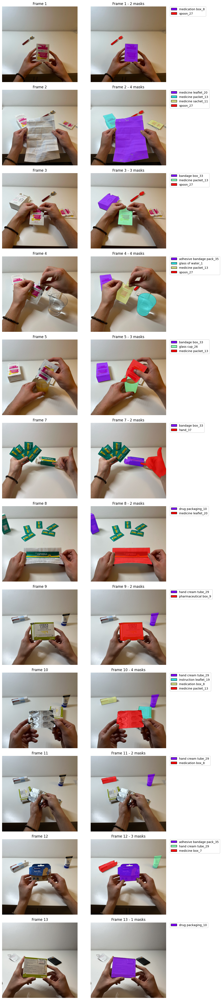

In [ ]:
with open('../data/casa_gio/processed/take/annotation.json') as f:
    annotations = json.load(f)
with open('../data/casa_gio/dataset_jsons/test_exoego_pairs.json') as f:
    pairs = json.load(f)

object_variants = {}
for obj_name_annotated in annotations['masks'].keys():
    parts = obj_name_annotated.rsplit('_', 1)
    if len(parts) == 2 and parts[1].isdigit():
        base_name = parts[0]
        if base_name not in object_variants:
            object_variants[base_name] = []
        object_variants[base_name].append(obj_name_annotated)

ego_frames = defaultdict(list)
for pair in pairs:
    ego_path = pair[0].split('//')
    frame_id = ego_path[-1]
    obj_name = ego_path[-3]
    
    mask_data = None
    
    if obj_name in annotations['masks']:
        if 'aria02_214-1' in annotations['masks'][obj_name]:
            if frame_id in annotations['masks'][obj_name]['aria02_214-1']:
                mask_data = annotations['masks'][obj_name]['aria02_214-1'][frame_id]
    
    if mask_data is None and obj_name in object_variants:
        for variant in object_variants[obj_name]:
            if 'aria02_214-1' in annotations['masks'][variant]:
                if frame_id in annotations['masks'][variant]['aria02_214-1']:
                    mask_data = annotations['masks'][variant]['aria02_214-1'][frame_id]
                    break
    
    if mask_data is None:
        print(f"WARNING: No mask found for {obj_name} in frame {frame_id}")
        continue
    
    # This is a COCO RLE: double check format expected by pycocotools 
    # pycocotools expects {'size': [h, w], 'counts': <bytes/'str'>}
    if isinstance(mask_data['counts'], str):
        # pycocotools expects UTF-8 or bytes for 'counts'
        mask_data = dict(mask_data)  # Make a copy to modify
        mask_data['counts'] = mask_data['counts'].encode('utf-8')
    ego_frames[frame_id].append((obj_name, mask_data))

base_path = '../data/casa_gio/processed/take/aria02_214-1'
n_frames = len(ego_frames)
fig, axes = plt.subplots(n_frames, 2, figsize=(12, 4*n_frames))
if n_frames == 1:
    axes = [axes]

for idx, (frame_id, masks_data) in enumerate(sorted(ego_frames.items(), key=lambda x: int(x[0]))):
    img = Image.open(f'{base_path}/{frame_id}.jpg')
    img_np = np.asarray(img)
    
    axes[idx][0].imshow(img_np)
    axes[idx][0].set_title(f'Frame {frame_id}')
    axes[idx][0].axis('off')
    
    axes[idx][1].imshow(img_np)
    img_h, img_w = img_np.shape[0], img_np.shape[1]
    combined_mask = np.zeros((img_h, img_w, 4)) 
    colors = plt.cm.rainbow(np.linspace(0, 1, max(len(masks_data), 1)))
    
    legend_patches = []
    for (obj_name, mask_rle), color in zip(masks_data, colors):
        rle = dict(mask_rle)
        if isinstance(rle['counts'], str):
            rle['counts'] = rle['counts'].encode('utf-8')
        mask = mask_utils.decode(rle) 
        if mask.shape != (img_h, img_w):
            print(f"WARNING: Mask shape {mask.shape} does not match image shape {(img_h, img_w)} for frame {frame_id} obj {obj_name}")

        alpha = 0.7
        rgba_color = np.array(list(color[:3]) + [alpha])
        combined_mask[mask > 0] = rgba_color
        legend_patches.append(Patch(facecolor=color, edgecolor='black', label=obj_name))

    if combined_mask.max() > 0:
        axes[idx][1].imshow(combined_mask)
    axes[idx][1].set_title(f'Frame {frame_id} - {len(masks_data)} masks')
    axes[idx][1].axis('off')
    
    if legend_patches:
        axes[idx][1].legend(handles=legend_patches, bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0., fontsize=10)

plt.tight_layout()
plt.show()

Same as above but for exo view.

In [ ]:
annotations_path = '../data/casa_gio/processed/take/annotation.json'
pairs_path = '../data/casa_gio/dataset_jsons/test_exoego_pairs.json'

with open(annotations_path) as f:
    annotations_full = json.load(f)
    annotations = annotations_full['masks'] 
with open(pairs_path) as f:
    pairs = json.load(f)

for obj_name_annotated in annotations.keys():
    parts = obj_name_annotated.rsplit('_', 1)
    if len(parts) == 2 and parts[1].isdigit():
        base_name = parts[0]
        if base_name not in object_variants:
            object_variants[base_name] = []
        object_variants[base_name].append(obj_name_annotated)

exo_frames = defaultdict(list)

for pair in pairs:
    exo_path_parts = pair[2].split('//')
    obj_name = exo_path_parts[-3]
    cam_name = exo_path_parts[-4]
    frame_id = exo_path_parts[-1]

    mask_data = None

    if obj_name in annotations and cam_name in annotations[obj_name]:
        cam_dict = annotations[obj_name][cam_name]
        if frame_id in cam_dict:
            mask_data = cam_dict[frame_id]

    if mask_data is None and obj_name in object_variants:
        for variant in object_variants[obj_name]:
            if (
                variant in annotations
                and cam_name in annotations[variant]
                and frame_id in annotations[variant][cam_name]
            ):
                mask_data = annotations[variant][cam_name][frame_id]
                break

    if mask_data is None:
        print(f"WARNING: No mask found for {obj_name} in cam {cam_name} frame {frame_id}")
        continue

    if isinstance(mask_data['counts'], str):
        mask_data = dict(mask_data)
        mask_data['counts'] = mask_data['counts'].encode('utf-8')
    exo_frames[(cam_name, frame_id)].append((obj_name, mask_data))

exo_base_path = '../data/casa_gio/processed/take/cam01'
n_frames = len(exo_frames)

if n_frames == 0:
    print("No frames with masks found!")
else:
    fig, axes = plt.subplots(n_frames, 2, figsize=(12, 4 * n_frames))
    if n_frames == 1:
        axes = [axes]

    for idx, ((cam_name, frame_id), masks_data) in enumerate(
        sorted(exo_frames.items(), key=lambda x: (x[0][0], int(x[0][1])))
    ):
        img_path = f"{exo_base_path}/{frame_id}.jpg"
        try:
            img = Image.open(img_path)
        except Exception as e:
            print(f"ERROR: Could not load image {img_path}: {e}")
            continue
        img_np = np.asarray(img)

        axes[idx][0].imshow(img_np)
        axes[idx][0].set_title(f'Cam {cam_name} Frame {frame_id}')
        axes[idx][0].axis('off')

        axes[idx][1].imshow(img_np)
        img_h, img_w = img_np.shape[0], img_np.shape[1]
        combined_mask = np.zeros((img_h, img_w, 4))  # RGBA for overlay
        colors = plt.cm.rainbow(np.linspace(0, 1, max(len(masks_data), 1)))

        legend_patches = []
        for (obj_name, mask_rle), color in zip(masks_data, colors):
            rle = dict(mask_rle)
            if isinstance(rle['counts'], str):
                rle['counts'] = rle['counts'].encode('utf-8')
            mask = mask_utils.decode(rle)
            if mask.shape != (img_h, img_w):
                print(f"WARNING: Mask shape {mask.shape} does not match image shape {(img_h, img_w)} for cam {cam_name} frame {frame_id} obj {obj_name}")

            alpha = 0.7
            rgba_color = np.array(list(color[:3]) + [alpha])
            combined_mask[mask > 0] = rgba_color
            legend_patches.append(Patch(facecolor=color, edgecolor='black', label=obj_name))

        if combined_mask.max() > 0:
            axes[idx][1].imshow(combined_mask)
        axes[idx][1].set_title(f'Cam {cam_name} Frame {frame_id} - {len(masks_data)} masks')
        axes[idx][1].axis('off')

        if legend_patches:
            axes[idx][1].legend(
                handles=legend_patches,
                bbox_to_anchor=(1.05, 1),
                loc='upper left',
                borderaxespad=0.,
                fontsize=10,
            )

    plt.tight_layout()
    plt.show()

Same as above but for both ego and exo in pairs.

In [ ]:
annotations_path = '../data/casa_gio/processed/take/annotation.json'
with open(annotations_path) as f:
    annotations_full = json.load(f)
    annotations = annotations_full['masks']
ego_base_path = '../data/casa_gio/processed/take/aria02_214-1'
exo_base_path = '../data/casa_gio/processed/take/cam01'
EGO_CAM = 'aria02_214-1'
EXO_CAM = 'cam01'
ego_masks = defaultdict(list)  # frame_id -> [(obj_name, mask_rle), ...]
exo_masks = defaultdict(list)  # frame_id -> [(obj_name, mask_rle), ...]

for obj_name, cam_dict in annotations.items():
    if EGO_CAM in cam_dict:
        for frame_id, mask_data in cam_dict[EGO_CAM].items():
            rle = dict(mask_data)
            if isinstance(rle['counts'], str):
                rle['counts'] = rle['counts'].encode('utf-8')
            ego_masks[frame_id].append((obj_name, rle))

    if EXO_CAM in cam_dict:
        for frame_id, mask_data in cam_dict[EXO_CAM].items():
            rle = dict(mask_data)
            if isinstance(rle['counts'], str):
                rle['counts'] = rle['counts'].encode('utf-8')
            exo_masks[frame_id].append((obj_name, rle))

# Get all unique frame IDs (1 to 13)
all_frames = sorted(set(ego_masks.keys()) | set(exo_masks.keys()), key=lambda x: int(x))
n_frames = len(all_frames)

# Create 13 x 2 grid
fig, axes = plt.subplots(n_frames, 2, figsize=(16, 5 * n_frames))
if n_frames == 1:
    axes = [axes]
def get_bright_colors(n):
    hsvs = [(i / n, 0.95, 1.0) for i in range(n)]
    rgbs = [colorsys.hsv_to_rgb(*hsv) for hsv in hsvs]
    # Ensure color is within [0,1]
    return [tuple(rgb) for rgb in rgbs]

all_objects = sorted(set(
    obj for masks in list(ego_masks.values()) + list(exo_masks.values()) 
    for obj, _ in masks
))
bright_colors = get_bright_colors(len(all_objects))
object_colors = {obj: bright_colors[i] for i, obj in enumerate(all_objects)}

def plot_with_masks(ax, img_path, masks_data, title, object_colors):
    """Plot image with overlayed masks and legend."""
    try:
        img = Image.open(img_path)
        img_np = np.asarray(img)
    except Exception as e:
        ax.text(0.5, 0.5, f'Image not found:\n{img_path}', 
                ha='center', va='center', transform=ax.transAxes)
        ax.set_title(title)
        ax.axis('off')
        return
    
    ax.imshow(img_np)
    img_h, img_w = img_np.shape[0], img_np.shape[1]
    
    if masks_data:
        combined_mask = np.zeros((img_h, img_w, 4))  # RGBA for overlay
        legend_patches = []
        
        for obj_name, mask_rle in masks_data:
            color = object_colors[obj_name]
            mask = mask_utils.decode(mask_rle)
            
            # Handle potential shape mismatch
            if mask.shape != (img_h, img_w):
                print(f"WARNING: Mask shape {mask.shape} != image shape {(img_h, img_w)} for {obj_name}")
                continue
        
            alpha = 0.6
            rgb = np.clip(np.array(color), 0, 1)
            rgba_color = np.array([rgb[0], rgb[1], rgb[2], alpha])
            combined_mask[mask > 0] = rgba_color
            legend_patches.append(Patch(facecolor=rgb, edgecolor='black', label=obj_name))
        
        if combined_mask.max() > 0:
            ax.imshow(combined_mask)
    
        if legend_patches:
            ax.legend(
                handles=legend_patches,
                bbox_to_anchor=(1.02, 1),
                loc='upper left',
                borderaxespad=0.,
                fontsize=8,
            )
    
    ax.set_title(f'{title} - {len(masks_data)} masks')
    ax.axis('off')
for idx, frame_id in enumerate(all_frames):
    ego_img_path = f"{ego_base_path}/{frame_id}.jpg"
    plot_with_masks(
        axes[idx][0], 
        ego_img_path, 
        ego_masks.get(frame_id, []), 
        f'EGO Frame {frame_id}',
        object_colors
    )

    exo_img_path = f"{exo_base_path}/{frame_id}.jpg"
    plot_with_masks(
        axes[idx][1], 
        exo_img_path, 
        exo_masks.get(frame_id, []), 
        f'EXO Frame {frame_id}',
        object_colors
    )

plt.tight_layout()
plt.show()

## Inference casa gio

This function, plot_casa_gio_predictions, visualizes predicted and ground truth segmentation masks for the casa_gio dataset. It loads predictions and GT masks from JSON files, optionally filters by object or frame, and displays overlays of the predictions (red), ground truth (green), and their overlap (yellow) for multiple samples in a grid layout. The IoU and confidence are shown for each prediction, and the function supports pagination for large numbers of samples.


In [ ]:
def plot_casa_gio_predictions(
    predictions_json_path,
    gt_json_path,
    root_dir,
    object_name=None,
    frame_num=None,
    num_samples=None
    ):
    
    with open(predictions_json_path, 'r') as f:
        pred_data = json.load(f)
    results = pred_data['exo-ego']['results']['take']['masks']


    with open(gt_json_path, 'r') as f:
        gt_data = json.load(f)
    gt_masks = gt_data['annotations']['take']['masks']
    
    processed_dir = Path(root_dir) / 'processed' / 'take'


    predictions = []
    for obj_name, obj_data in results.items():
        for cam_name, cam_data in obj_data.items():
            for frame_id, frame_data in cam_data.items():
                predictions.append({
                    'object_name': obj_name,
                    'camera_name': cam_name,  # e.g., 'cam01_aria02_214-1'
                    'frame_num': frame_id,
                    'pred_mask': frame_data['pred_mask'],
                    'confidence': frame_data.get('confidence', [0])[0]
                })

    print(f"Total predictions available: {len(predictions)}")


    if object_name or frame_num:
        predictions = [p for p in predictions if 
                      (object_name is None or p['object_name'] == object_name) and
                      (frame_num is None or p['frame_num'] == str(frame_num))]
        print(f"After filtering: {len(predictions)} predictions")

    if len(predictions) == 0:
        print("No predictions found!")
        return None


    if num_samples and len(predictions) > num_samples:
        import random
        predictions = random.sample(predictions, num_samples)


    predictions = sorted(predictions, key=lambda x: (x['object_name'], int(x['frame_num'])))

    print(f"Plotting {len(predictions)} prediction(s)")

    ncols = 4
    nrows = 8
    per_page = ncols * nrows
    npages = int(np.ceil(len(predictions) / per_page))

    for page in range(npages):
        start_i = page * per_page
        end_i = min((page + 1) * per_page, len(predictions))
        preds_page = predictions[start_i:end_i]

        fig, axes = plt.subplots(
            nrows=nrows, ncols=ncols, 
            figsize=(ncols * 4, nrows * 3)
        )
        axes = axes.flatten()

        for ax in axes:
            ax.axis('off')  # Hide unused by default

        for idx, pred in enumerate(preds_page):
            ax = axes[idx]

            cam_parts = pred['camera_name'].split('_', 1)
            exo_cam = cam_parts[0]  # 'cam01'
            ego_cam = cam_parts[1] if len(cam_parts) > 1 else cam_parts[0]  # 'aria02_214-1'


            img_path = processed_dir / ego_cam / f"{pred['frame_num']}.jpg"
            if not img_path.exists():
                print(f"Image not found: {img_path}")
                continue

            img = Image.open(img_path).convert('RGB')
            img_array = np.array(img)
            img_h, img_w = img_array.shape[:2]

            # Decode prediction mask
            pred_rle = pred['pred_mask']
            pred_mask = mask_util.decode(pred_rle)
            

            if pred_mask.shape != (img_h, img_w):
                pil_mask = Image.fromarray(pred_mask.astype(np.uint8) * 255)
                pil_mask = pil_mask.resize((img_w, img_h), resample=Image.NEAREST)
                pred_mask = (np.array(pil_mask) > 127).astype(np.uint8)


            gt_mask = None
            try:
                gt_obj = gt_masks.get(pred['object_name'], {})
                gt_cam_data = gt_obj.get(ego_cam, {})
                if pred['frame_num'] in gt_cam_data:
                    gt_rle = gt_cam_data[pred['frame_num']]
                    gt_mask_raw = mask_util.decode(gt_rle)
                    if gt_mask_raw.shape != (img_h, img_w):
                        pil_mask = Image.fromarray(gt_mask_raw.astype(np.uint8) * 255)
                        pil_mask = pil_mask.resize((img_w, img_h), resample=Image.NEAREST)
                        gt_mask = (np.array(pil_mask) > 127).astype(np.uint8)
                    else:
                        gt_mask = gt_mask_raw
            except Exception as e:
                print(f"GT mask loading failed: {e}")
                gt_mask = None

            if gt_mask is not None:
                intersection = np.logical_and(gt_mask, pred_mask).sum()
                union = np.logical_or(gt_mask, pred_mask).sum()
                iou_value = intersection / union if union > 0 else float('nan')
            else:
                iou_value = float('nan')


            overlay = img_array.copy()
            pred_color = np.array([255, 0, 0], dtype=np.uint8)    # Red
            gt_color = np.array([0, 255, 0], dtype=np.uint8)      # Green
            yellow_color = np.array([255, 255, 0], dtype=np.uint8) # Yellow

            pred_indices = (pred_mask == 1)
            gt_indices = (gt_mask == 1) if gt_mask is not None else np.zeros_like(pred_mask, dtype=bool)
            overlap_indices = pred_indices & gt_indices
            only_pred = pred_indices & (~overlap_indices)
            only_gt = gt_indices & (~overlap_indices)


            alpha = 0.5
            overlay[only_gt] = (overlay[only_gt].astype(float) * alpha + gt_color * (1 - alpha)).astype(np.uint8)
            overlay[only_pred] = (overlay[only_pred].astype(float) * alpha + pred_color * (1 - alpha)).astype(np.uint8)
            overlay[overlap_indices] = (overlay[overlap_indices].astype(float) * (1 - alpha) + yellow_color * alpha).astype(np.uint8)


            ax.imshow(overlay)

            title_lines = [
                f"Obj: {pred['object_name']}",
                f"Frame: {pred['frame_num']}",
                f"Conf: {pred['confidence']:.3f}",
                f"IoU: {iou_value:.3f}" if not np.isnan(iou_value) else "IoU: N/A"
            ]
            ax.set_title("\n".join(title_lines), fontsize=9)
            ax.axis('off')


            if idx == 0:
                red_patch = mpatches.Patch(color='#ff0000', label='Prediction')
                green_patch = mpatches.Patch(color='#00ff00', label='Ground Truth')
                yellow_patch = mpatches.Patch(color='#ffff00', label='Overlap')
                ax.legend(handles=[red_patch, green_patch, yellow_patch], loc='lower right', fontsize=8)

        plt.tight_layout()
        plt.show()

    return predictions

Total predictions available: 32
Plotting 32 prediction(s)


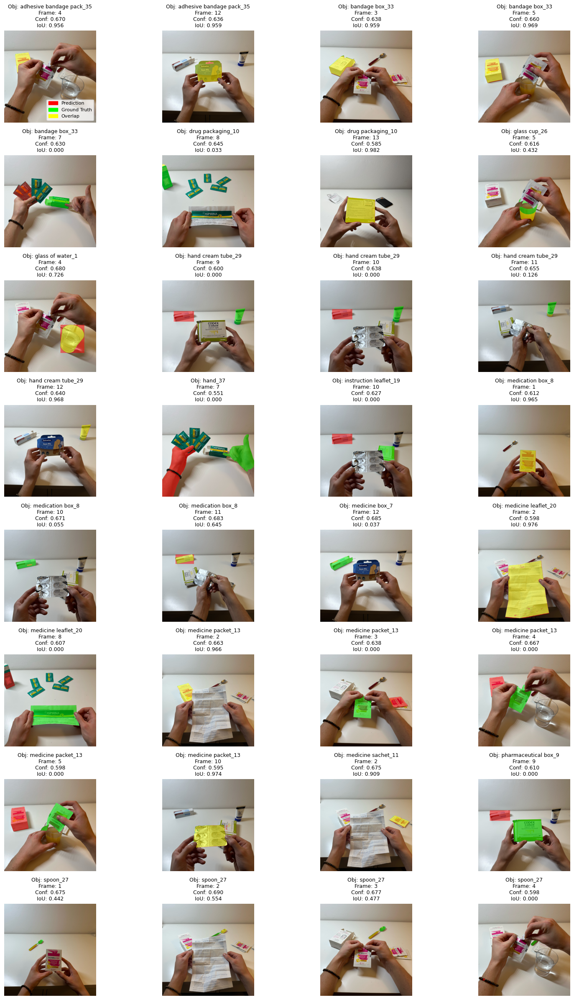

In [ ]:
predictions = plot_casa_gio_predictions(
    predictions_json_path='../results/final/casa_gio_baseline/exo2ego_predictions_casa_gio.json',
    gt_json_path='../results/final/casa_gio_baseline/exo2egoGT.json',
    root_dir='../data/casa_gio',
)

Total predictions available: 32
Plotting 32 prediction(s)


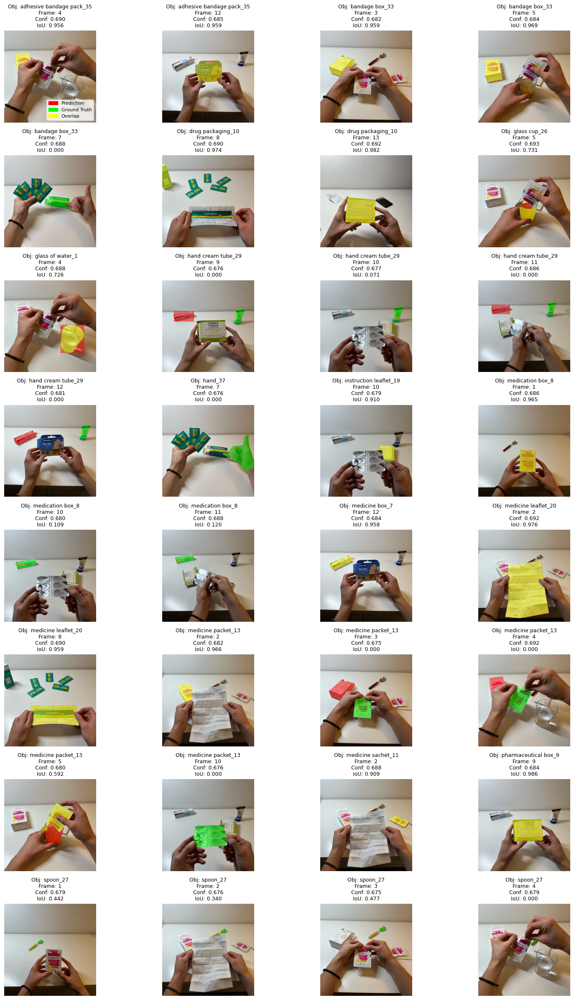

In [ ]:
predictions = plot_casa_gio_predictions(
    predictions_json_path='results/final/casa_gio_finetuned/exo2ego_predictions_casa_gio.json',
    gt_json_path='results/final/casa_gio_finetuned/exo2egoGT.json',
    root_dir='health_casa_gio',
)